<a href="https://colab.research.google.com/github/zi-ju/yolo11s-training/blob/main/YOLO_training_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Reference**: https://github.com/EdjeElectronics/Train-and-Deploy-YOLO-Models

**Video Tutorial** https://www.youtube.com/watch?v=r0RspiLG260

**Dataset**: https://www.kaggle.com/datasets/afsananadia/fruits-images-dataset-object-detection/data


"Runtime" -> "Change runtime type" -> Select one of the GPU options

# Prepare dataset

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
import os

## Clean file names and get class names

In [19]:
train_folder = '/content/drive/MyDrive/YOLO_training_demo_dataset/Train File/Train File'
test_folder = '/content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File'


# Get the set of class names
class_names = set()

def clean_filenames(path):
  for filename in os.listdir(path):
    old_path = os.path.join(path, filename)

    # Remove spaces in filename
    new_filename = filename.replace(" ", "")

    # Correct spelling
    new_filename = new_filename.replace("HogPulm", "HogPlum")
    new_filename = new_filename.replace("Lichi", "Litchi")
    new_filename = new_filename.replace("banana", "Banana")
    new_filename = new_filename.replace("orange", "Orange")

    new_path = os.path.join(path, new_filename)

    # Rename only if the filename changed
    if old_path != new_path:
        os.rename(old_path, new_path)
        print(f"Renamed: {filename} → {new_filename}")

    # Add to class names set
    class_name = new_filename.split('_')[1].split('.')[0]
    class_names.add(class_name)

clean_filenames(train_folder)
clean_filenames(test_folder)

print(class_names)

{'Papaya', 'Banana', 'Grapes', 'Orange', 'Mango', 'Apple', 'Jackfruit', 'Guava', 'Litchi', 'HogPlum'}


In [21]:
# map numbers to class_names
class_name_to_number = {class_name: i for i, class_name in enumerate(class_names)}
print(class_name_to_number)

# number to class names
number_to_class_name = {i: class_name for class_name, i in class_name_to_number.items()}
print(number_to_class_name)

{'Papaya': 0, 'Banana': 1, 'Grapes': 2, 'Orange': 3, 'Mango': 4, 'Apple': 5, 'Jackfruit': 6, 'Guava': 7, 'Litchi': 8, 'HogPlum': 9}
{0: 'Papaya', 1: 'Banana', 2: 'Grapes', 3: 'Orange', 4: 'Mango', 5: 'Apple', 6: 'Jackfruit', 7: 'Guava', 8: 'Litchi', 9: 'HogPlum'}


## Organize files with 'images' and 'labels' folder

In [20]:
def organize_folder(path):
  # Create sub folders if they don't exist
  images_folder = os.path.join(path, "images")
  labels_folder = os.path.join(path, "labels")
  os.makedirs(images_folder, exist_ok=True)
  os.makedirs(labels_folder, exist_ok=True)

  for filename in os.listdir(path):
    file_path = os.path.join(path, filename)

    # Skip directories
    if os.path.isdir(file_path):
      continue

    # Move image files to 'images' folder
    if filename.lower().endswith((".jpg", ".jpeg")):
      new_path = os.path.join(images_folder, filename)
      os.rename(file_path, new_path)

    # Move text files to 'labels' folder
    elif filename.lower().endswith(".txt"):
      new_path = os.path.join(labels_folder, filename)
      os.rename(file_path, new_path)

  # Verify if file numbers are same in 'images' and 'labels' folder
  print(len(os.listdir(images_folder)))
  print(len(os.listdir(labels_folder)))

organize_folder(train_folder)
organize_folder(test_folder)

320
320
80
80


## Update class number in label files

In [22]:
def update_label_files(labels_folder):
  for filename in os.listdir(labels_folder):
    if filename.endswith(".txt"):
      # Extract class name from the filename
      class_name = filename.split('_')[1].split('.')[0]

      # Get the corresponding class number
      class_number = class_name_to_number.get(class_name)

      # Read file content and update the first number with class number
      file_path = os.path.join(labels_folder, filename)
      with open(file_path, "r") as file:
        lines = file.readlines()

      # Modify the first number in each line
      updated_lines = []
      for line in lines:
        parts = line.split()
        if parts:  # Ensure the line is not empty
          parts[0] = str(class_number)  # Replace the first number with class number
          updated_lines.append(" ".join(parts) + "\n")

      # Write back the modified content
      with open(file_path, "w") as file:
          file.writelines(updated_lines)

train_labels_path = os.path.join(train_folder, "labels")
test_labels_path = os.path.join(test_folder, "labels")

update_label_files(train_labels_path)
update_label_files(test_labels_path)

# Train model

In [32]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.8/921.8 kB 47.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 106.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 76.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

## Get list of class names

In [27]:
classes = list(class_names)
print(classes)

['Papaya', 'Banana', 'Grapes', 'Orange', 'Mango', 'Apple', 'Jackfruit', 'Guava', 'Litchi', 'HogPlum']


## Create the Ultralytics training configuration YAML file.

In [30]:
# Python function to automatically create data.yaml config file
# 1. Creates data dictionary with correct paths to folders, number of classes, and names of classes
# 2. Writes data in YAML format to data.yaml

import yaml

def create_data_yaml(path_to_data_yaml, data_path, train_path, val_path, classes):
  number_of_classes = len(classes)

  # Create data dictionary
  data = {
      'path': data_path,
      'train': train_path,
      'val': val_path,
      'nc': number_of_classes,
      'names': classes
  }

  # Write data to YAML file
  with open(path_to_data_yaml, 'w') as f:
    yaml.dump(data, f, sort_keys=False)
  print(f'Created config file at {path_to_data_yaml}')

  return

# Define path and run function
root_folder = '/content/drive/MyDrive/YOLO_training_demo_dataset/'
path_to_data_yaml = os.path.join(root_folder, 'data.yaml')
data_path = os.path.join(root_folder, 'data')
train_path = os.path.join(root_folder, 'Train File/Train File/images')
val_path = os.path.join(root_folder, 'Test File/Test File/images')

create_data_yaml(path_to_data_yaml, data_path, train_path, val_path, classes)

print('\nFile contents:\n')
!cat '/content/drive/MyDrive/YOLO_training_demo_dataset/data.yaml'

Created config file at /content/drive/MyDrive/YOLO_training_demo_dataset/data.yaml

File contents:

path: /content/drive/MyDrive/YOLO_training_demo_dataset/data
train: /content/drive/MyDrive/YOLO_training_demo_dataset/Train File/Train File/images
val: /content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File/images
nc: 10
names:
- Papaya
- Banana
- Grapes
- Orange
- Mango
- Apple
- Jackfruit
- Guava
- Litchi
- HogPlum


## Train model

In [33]:
!yolo detect train data=/content/drive/MyDrive/YOLO_training_demo_dataset/data.yaml model=yolo11s.pt epochs=60 imgsz=640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100% 18.4M/18.4M [00:00<00:00, 188MB/s]
Ultralytics 8.3.79 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/content/drive/MyDrive/YOLO_training_demo_dataset/data.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, sp

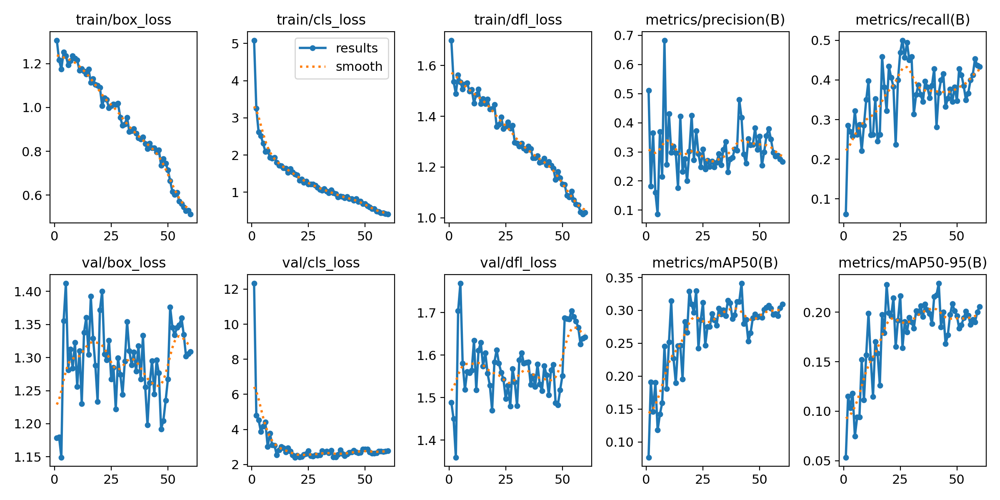

In [40]:
from IPython.display import Image
Image('/content/runs/detect/train/results.png')


# Test model

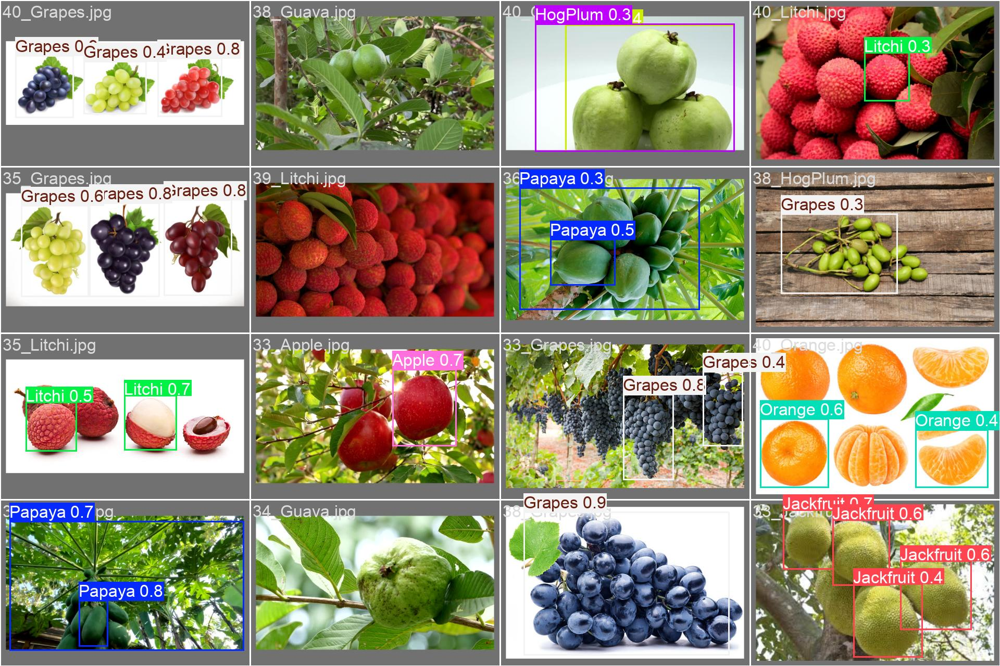

In [43]:
Image('/content/runs/detect/train/val_batch0_pred.jpg')

In [37]:
!yolo detect predict model=runs/detect/train/weights/best.pt source="/content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File/images" save=True

Ultralytics 8.3.79 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,416,670 parameters, 0 gradients, 21.3 GFLOPs

image 1/80 /content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File/images/33_Apple.jpg: 384x640 1 Apple, 49.4ms
image 2/80 /content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File/images/33_Banana.jpg: 640x480 (no detections), 60.0ms
image 3/80 /content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File/images/33_Grapes.jpg: 416x640 2 Grapess, 46.1ms
image 4/80 /content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File/images/33_Guava.jpg: 480x640 1 Guava, 46.6ms
image 5/80 /content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File/images/33_HogPlum.jpg: 448x640 2 HogPlums, 51.4ms
image 6/80 /content/drive/MyDrive/YOLO_training_demo_dataset/Test File/Test File/images/33_Jackfruit.jpg: 448x640 3 Jackfruits, 12.2ms
image 7/80 /content/drive/MyDrive/YOLO_training_dem

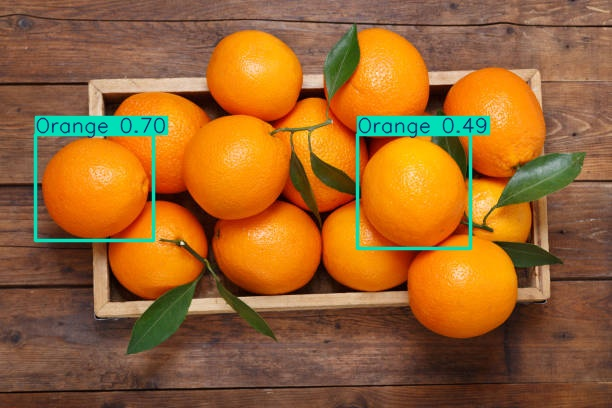

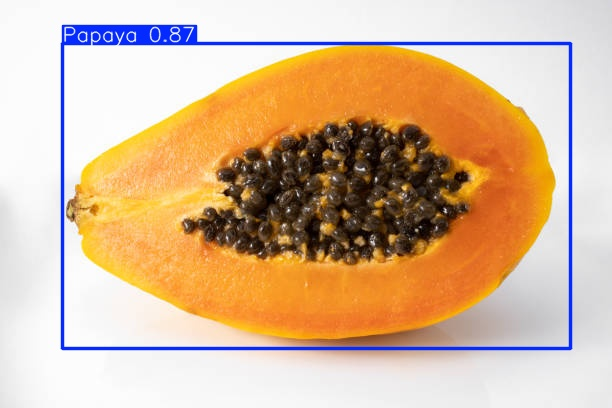

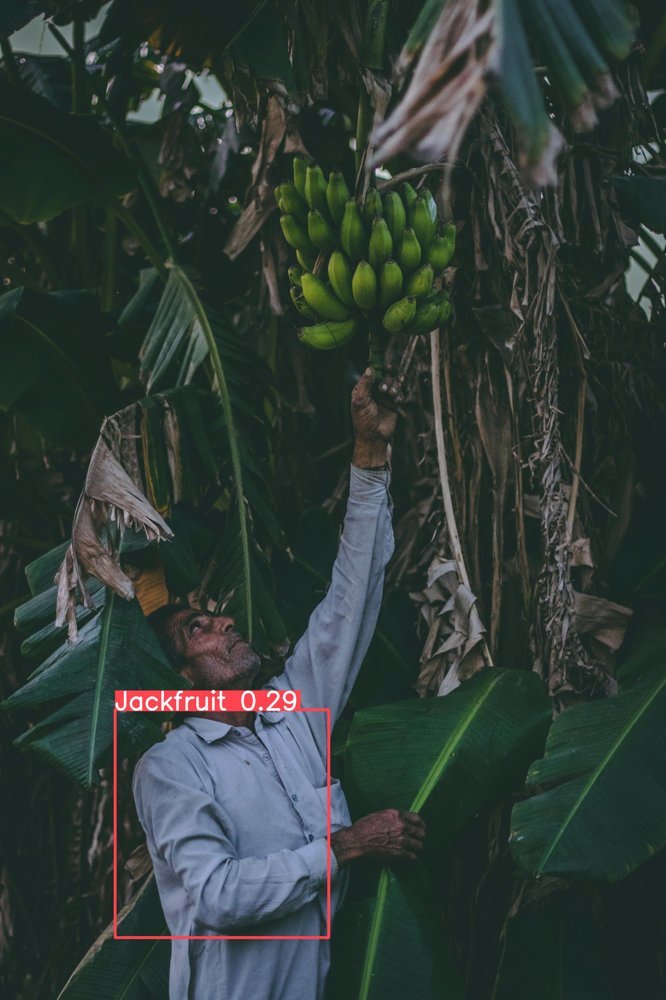

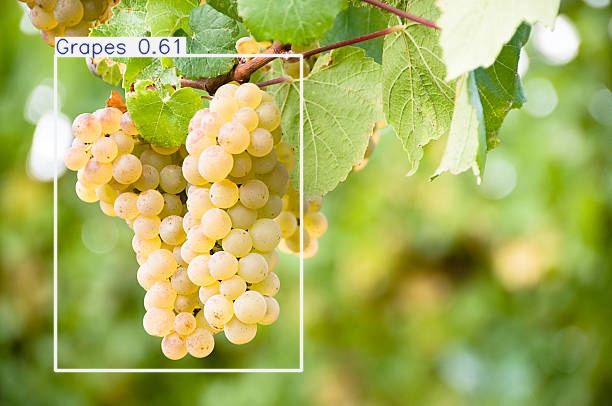

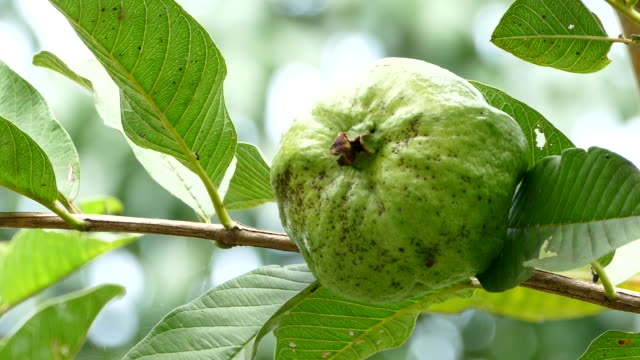

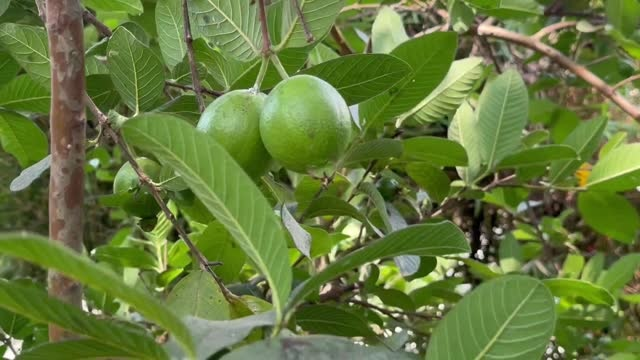

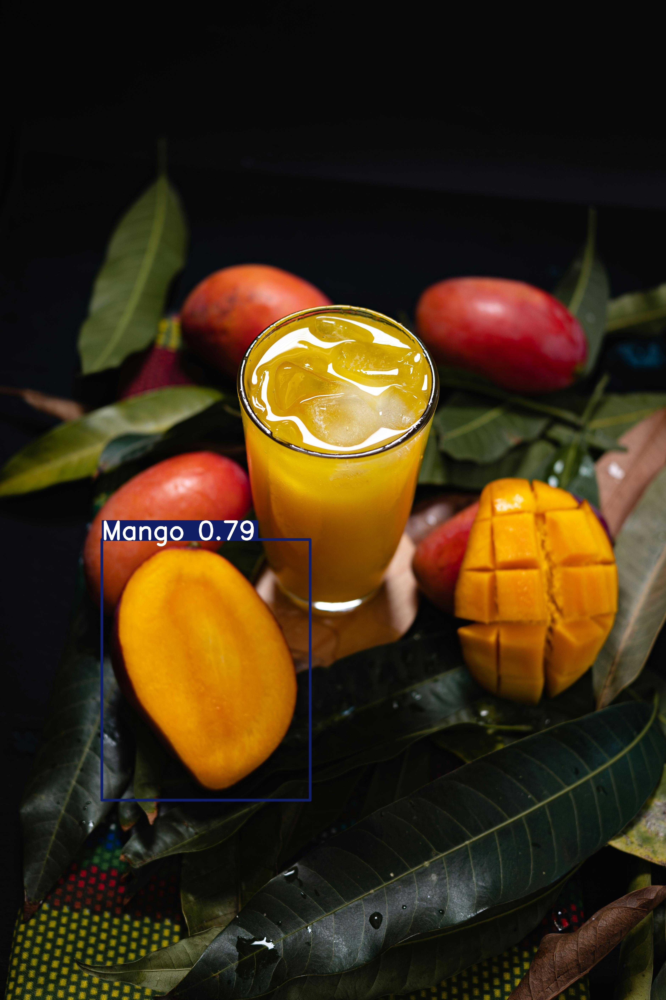

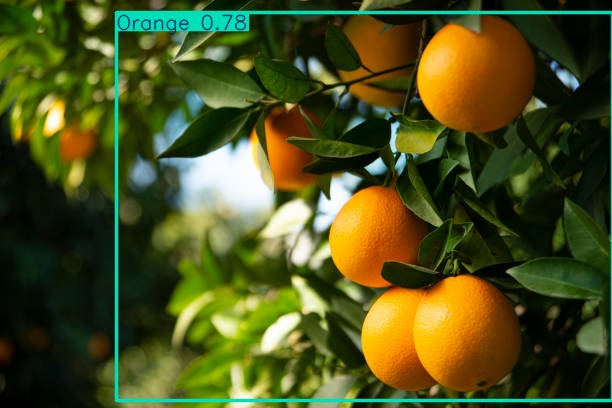

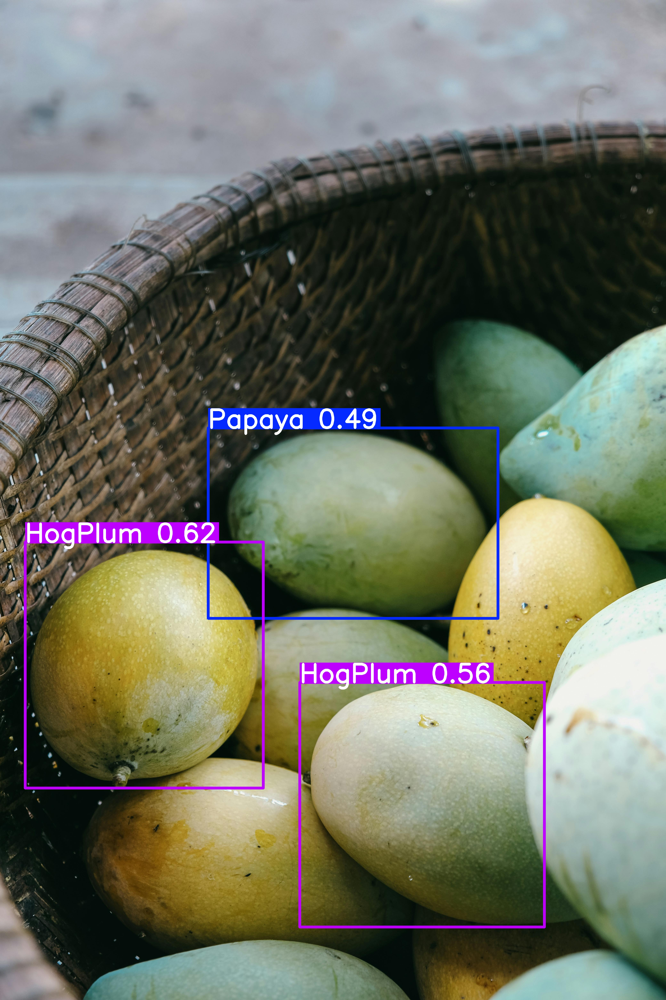

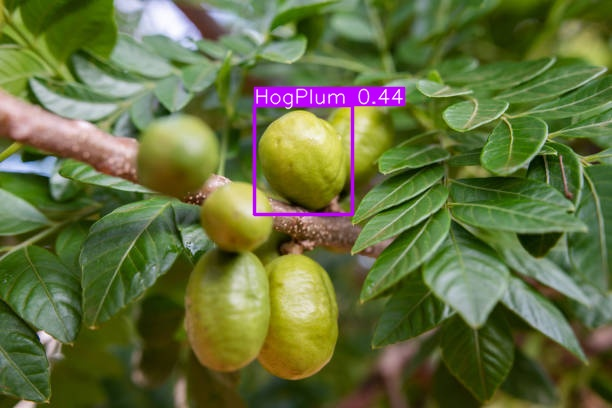

In [39]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[10:20]:
  display(Image(filename=image_path, height=300))
  print('\n')